In [1]:
import os
import shap
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline

# tf.enable_eager_execution()

from cytoself.models import CytoselfFullModel
from cytoself.data_loader.data_manager import DataManager
from cytoself.analysis.analytics import Analytics

from tensorflow.compat.v1 import keras
from tensorflow.compat.v1.keras.datasets import mnist
from tensorflow.compat.v1.keras.models import Sequential
from tensorflow.compat.v1.keras.layers import Dense, Dropout, Flatten
from tensorflow.compat.v1.keras.layers import Conv2D, MaxPooling2D
from tensorflow.compat.v1.keras import backend as K

from sklearn.preprocessing import OneHotEncoder


import cv2
from tensorflow.compat.v1.keras.models import Model
from tensorflow.python.keras.backend import set_session

import glob
import sys
sys.path.append("..")
from model import load_data, get_analytics, train_model
from cytoself_custom import plot_umap

import logging

from cytoself.models import CytoselfFullModel
from cytoself.data_loader.data_manager import DataManager
from cytoself.analysis.analytics import Analytics

import cv2
from tensorflow.compat.v1.keras.models import Model
from tensorflow.python.keras.backend import set_session

import sys
sys.path.append("..")
from config import PRETRAINED_MODEL_PATH
from config import SEED
from model import load_data, train_model
import random 

np.random.seed(SEED)
random.seed(SEED)

%reload_ext autoreload
%autoreload 2
%aimport

print("Sanity")

/home/labs/eransegal/sagyk/.conda/envs/cytoself/lib/python3.7/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm

Bad key text.latex.preview in file /home/labs/eransegal/sagyk/.conda/envs/cytoself/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 123 ('text.latex.preview : False')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.5.2/matplotlibrc.template
or from the matplotlib source distribution

Bad key mathtext.fallback_to_cm in file /home/labs/eransegal/sagyk/.conda/envs/cytoself/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 155 ('mathtext.fallback_to_cm : True  # When True, use symbols from the Computer Modern')
You probably need to get an updated matplotlibrc file from
https://githu

Modules to reload:
all-except-skipped

Modules to skip:

Sanity


In [2]:
def get_parent_folder_name(path):
  return os.path.basename(os.path.dirname(path))

def plot_images(images, cmap=None):
  if images is None:
    raise ValueError("No images")
  
  if type(images) is not np.ndarray:
    if type(images) is not list:
      images = [images]
    images = np.array(images)
    
  n_images = len(images)
  
  if n_images == 0:
    raise ValueError("No images")
  
  
  for i in range(n_images):
    _, ax = plt.subplots(1,2)
    for j in range(len(ax)):
      ax[j].imshow(images[i,...,j], cmap=cmap)
      ax[j].set_xticks([])
      ax[j].set_yticks([])
    plt.show()  

def get_analytics(X, y, model_path, verbose=True):
    y_unique = np.unique(y)
    model = CytoselfFullModel(input_image_shape=X.shape[1:], num_fc_output_classes=len(y_unique))
    data_manager = DataManager(
        test_data=X,
        test_label=y
    )

    if verbose:
        print("Loading weights")

    model.load_model(model_path)

    # Generate ground truth from labels
    gt_table = pd.DataFrame([[l, l] for l in y_unique], columns=["gene_name", "localization"])

    if verbose:
        print("Ground truth:")
        print(gt_table['gene_name'].values)

    return Analytics(model, data_manager, gt_table=gt_table)



def generate_images(analytics, images_indexes=None, embvecs=None,\
                      reset_embvec=True, only_second_layer=False, show=True, 
                      cmap_original = 'rainbow', cmap_reconstructed = 'rainbow', enhance_contrast=True):
    vq_layer = 1 if only_second_layer else 0 
  
    # Create decoder model
    dec_model = analytics.model.construct_decoder_model(dec_idx=vq_layer+1)

    # Load embedding vectors
    if embvecs is None:
        if analytics.model.embvec is None or reset_embvec:
            analytics.model.calc_embvec(analytics.data_manager.test_data)
        embvec0 = analytics.model.embvec[0].copy()
        embvec1 = analytics.model.embvec[1].copy()
    else:
        embvec0 = embvecs[0].copy()
        embvec1 = embvecs[1].copy()


    # Load data
    if images_indexes is None:
        # Take all
        images_indexes = np.arange(len(analytics.data_manager.test_data))

    train_raw = analytics.data_manager.test_data[images_indexes]
    train_labels = analytics.data_manager.test_label[images_indexes].flatten()
    num_img = len(images_indexes)
    train_raw = train_raw[:num_img]

    embvec0 = embvec0[images_indexes]
    embvec1 = embvec1[images_indexes]
    print(embvec0.shape, embvec1.shape)

    if vq_layer == 1:
        embvecs = embvecs[0]
    embvecs = [embvec1.reshape(-1, 4, 4, 576), embvec0]

    # Generate images
    train_gen = dec_model.predict(embvecs)
    train_gen = train_gen[:num_img]

    if not show:
        return train_gen

    ################ Plot generated images ################

    fig, ax = plt.subplots(num_img,5, figsize=(8,8), dpi=1000)
    fig.patch.set_facecolor('white')

    # Set titles
    titles = ['Target_Org', 'Nucleus_Org', 'Target', 'Nucleus']
    current_ax = ax[0] if num_img > 1 else ax
    for i, t in enumerate(titles):
        current_ax[i].set_title(t, fontsize=3)

    # Show images
    cax = fig.add_axes([0, 0.5, 0.01, 0.1])
    for i in range(num_img):
        current_ax = ax[i] if num_img > 1 else ax

        ##### ORIGINAL IMAGES ######

        # Target channel - original image
        img = train_raw[i,...,0]
        # Increase contrast with min-max scaling
        if enhance_contrast:
            X_std = (img - img.min(axis=0)) / (img.max(axis=0) - img.min(axis=0))
            img = X_std * (1 - 0) + 0
        im = current_ax[0].imshow(img, cmap = cmap_original, interpolation = 'sinc')
        current_ax[0].set_axis_off()

        # Nucleus channel - original image
        img = train_raw[i,...,1]
        # Increase contrast with min-max scaling
        if enhance_contrast:
            X_std = (img - img.min(axis=0)) / (img.max(axis=0) - img.min(axis=0))
            img = X_std * (1 - 0) + 0
        im = current_ax[1].imshow(img, cmap = cmap_original, interpolation = 'sinc')
        current_ax[1].set_axis_off()

        ###############################

        ##### GENERATED IMAGES ######

        # Target
        img = train_gen[i,...,0]
        if enhance_contrast:
            X_std = (img - img.min(axis=0)) / (img.max(axis=0) - img.min(axis=0))
            img = X_std * (1 - 0) + 0
        im = current_ax[2].imshow(img, cmap = cmap_reconstructed, interpolation = 'sinc')
        current_ax[2].set_axis_off()

        # Nucleus
        img = train_gen[i,...,1]
        if enhance_contrast:
            X_std = (img - img.min(axis=0)) / (img.max(axis=0) - img.min(axis=0))
            img = X_std * (1 - 0) + 0
        im = current_ax[3].imshow(img, cmap = cmap_reconstructed, interpolation = 'sinc')
        current_ax[3].set_axis_off()

        ###############################

        # Label
        current_ax[4].set_axis_off()
        current_ax[4].text(0,0.5,train_labels[i], fontsize='xx-small')

    # Add colorbar
    fig.colorbar(im, cax=cax, orientation='vertical')

    # Reduce the space between axes
    plt.subplots_adjust(left=0.1,
                  bottom=0.1, 
                  right=0.3, 
                  top=0.9)
    plt.show()

    return train_gen

def load_data(data_path, model_path, n_classes=26):
    # Load data
    print(f"Loading data")

    X = np.load(data_path)
#     y = np.array([get_parent_folder_name(data_path)]*(len(X)//2) + [get_parent_folder_name(data_path)+'-test']*(len(X)-len(X)//2))
#     y= np.array([get_parent_folder_name(data_path)]*len(X))
    x_len = len(X)
    y=np.asarray([])
    yy = x_len // n_classes
    for i in range(n_classes-1):
        y = np.append(y, [i]*yy)
    y = np.append(y, [n_classes]*(x_len - yy))
    
    print(f"X.shape: {X.shape}, y.shape: {y.shape}")

    sess = tf.Session()
#     graph = tf.get_default_graph()

    set_session(sess)

    # Plot sample of images
    # print(f"Plotting images")
    # plot_images(X[:10], cmap='rainbow')

    # Get analytics
    print(f"Getting  analytics")
    analytics = get_analytics(X, y, model_path)

    return X,y, analytics, sess

def grad_CAM(X, y, sess, layer=1):
    #     vq2_layer = analytics.model.model.get_layer('VQ2')
    vq_layer = analytics.model.model.get_layer(f'VQ{layer}')

    #     vq2_layer_output_scheme = vq2_layer.output[::-1][1]
    vq_layer_output_scheme = vq_layer.output[::-1][1]


    #     vq2_layer_model = Model(analytics.model.img_input, vq2_layer_output_scheme)
    vq_layer_model = Model(analytics.model.img_input, vq_layer_output_scheme)
    
    classifier_input = tf.keras.Input(shape=vq_layer_output_scheme.shape[1:])
    x = analytics.model.model.get_layer(f'fc{layer}')(classifier_input)
    classifier_model = tf.keras.Model(classifier_input, x)
    
    

    with tf.GradientTape() as tape:
        inputs = tf.cast(X, tf.float32)
        convOutputs = vq_layer_model(inputs)

        predictions = classifier_model(convOutputs)

#         ohe = OneHotEncoder()
#         yyy_encoded = ohe.fit_transform(y).toarray()
#         loss = tf.keras.losses.CategoricalCrossentropy()(yyy_encoded, predictions)
        
        # top_pred_index = tf.argmax(preds[0])
        # top_class_channel = vq_layer_output[...,top_pred_index]
        loss = predictions[:,0]
        print(predictions)

    
    # As in cytoself - fc block contains two MPL blocks- the first uses relu and the second softmax
    # relu
    grads = tf.convert_to_tensor(tf.gradients(loss, convOutputs))
#     castConvOutputs = tf.cast(convOutputs > 0, "float32")
#     castGrads = tf.cast(grads > 0, "float32")
    
#     castConvOutputs = tf.cast(tf.keras.activations.relu(convOutputs), "float32")
    castGrads = tf.cast(tf.keras.activations.relu(grads), "float32")
    
    guidedGrads = convOutputs * castGrads# * grads
#     guidedGrads = convOutputs * grads

    
    convOutputs = convOutputs[0]
#     guidedGrads = guidedGrads[0]
    
    # Softmax?
    weights = tf.keras.activations.softmax(guidedGrads)
    weights = tf.reduce_mean(weights, axis=(0,1))
    
    print(weights.shape, convOutputs.shape)
    
#     print(weights.shape, convOutputs.shape, tf.multiply(weights, convOutputs).shape)
    cam = tf.reduce_mean(tf.multiply(weights, convOutputs), axis=-1)
#     print(cam.shape)

    (w,h) = (X.shape[2], X.shape[1])
    heatmap = cv2.resize(cam.eval(session=sess), (w,h))
    heatmap = (heatmap - np.min(heatmap)) / ((heatmap.max() - heatmap.min()) + np.finfo(np.float32).eps)
    
    
    return vq_layer_model, classifier_model, heatmap

def plot_gradCAM(X,heatmap, cmap='Greys', increase_contrast=False):
    fig, ax = plt.subplots(1,2)
    img = X[0,...,0]
    
    if increase_contrast:
        img = (img - np.min(img)) / (np.max(img) - np.min(img))
        
    ax[0].imshow(img, cmap=cmap)

    ax[1].imshow(img, cmap=cmap)
    im = ax[1].imshow(heatmap, alpha=0.7, cmap='afmhot_r')
    fig.colorbar(im,orientation='vertical')
    
    return fig, ax

def get_classifier_mode(analytics, layer=1):
    classifier_model = analytics.model.model.get_layer(f'fc{layer}')
    return classifier_model

def get_res(analytics, X, ret_mul=False, y=None):
    layer = 1
    vq_layer = analytics.model.model.get_layer(f'VQ{layer}')

    vq_layer_output_scheme = vq_layer.output[::-1][1]

    vq_layer_model = Model(analytics.model.img_input, vq_layer_output_scheme)


    classifier_model = get_classifier_mode(analytics, layer=layer)



    inputs = tf.cast(X, tf.float32)
    convOutputs = vq_layer_model(inputs)

    convOutputs_eval = convOutputs.eval(session=K.get_session())
    
    if not ret_mul:
        return convOutputs_eval


    predictions = classifier_model(convOutputs)

    ohe = OneHotEncoder()
    yyy_encoded = ohe.fit_transform(y).toarray()
    loss = tf.keras.losses.CategoricalCrossentropy()(yyy_encoded, predictions)

    # As in cytoself - fc block contains two MPL blocks- the first uses relu and the second softmax
    # relu
    grads = tf.convert_to_tensor(tf.gradients(loss, convOutputs))

    guidedGrads = convOutputs * castGrads# * grads


    # Softmax?
    weights = tf.keras.activations.softmax(guidedGrads)
    weights = tf.reduce_mean(weights, axis=(0,1))


    mul = tf.multiply(weights, convOutputs)
    cam = tf.reduce_mean(mul, axis=-1)

    mul_eval = mul.eval(session=K.get_session())
    
    return mul_eval

# Cant test for different conditions/cell lines because the model saw only WT unstressed (26 labels), and fc output size is 26
def get_data(input_folders, set_type=None, markers=None, condition_l=False, conds_include=["unstressed"]):
    images, labels, labels_changepoints, markers_order = load_data(input_folders, condition_l=condition_l, type_l=False,
                                                                   cell_lines_include=["WT"],
                                                                   conds_include=conds_include,
                                                                   split_by_set=set_type is not None,
                                                                      set_type=set_type,
                                                                   markers=markers)
    #     split_by_set_include=[("WT", "unstressed")]
    print(images.shape, labels.shape)
    print(pd.Series(labels.reshape(-1,)).value_counts())
          
    return images, labels, labels_changepoints, markers_order

def get_all_data(set_type, model_path, subset_counts=None):
    X, y, labels_changepoints, markers_order = get_data(input_folders,
                                                                    set_type=set_type,
                                                                    markers=markers,
                                                                    condition_l=condition_l,
                                                                    conds_include=conds_include)
    if subset_counts is not None:
        # Susbset dataset
        indx = np.asarray([np.arange(i, i+subset_counts) for i in labels_changepoints[:-1]]).flatten()

        X, y = X[indx,...], y[indx,...]
        
        
    analytics = get_analytics(X, y, model_path=model_path)

    return X, y, analytics

# Function to plot images
def plot_categories(images, labels):
    fig, axes = plt.subplots(1, len(images)+1, figsize=(25, 15))
    axes = axes.flatten()
  
    # Plot an empty canvas
    ax = axes[0]
    dummy_array = np.array([[[0, 0, 0, 0]]], dtype='uint8')
    ax.set_title("reference")
    ax.set_axis_off()
    ax.imshow(dummy_array, interpolation='nearest')

    # Plot an image for every category
    for k,v in enumerate(images):
        ax = axes[k+1]
        ax.imshow(v[...,0], cmap='rainbow')
        ax.set_title(f"{labels[k]}")
        ax.set_axis_off()

    plt.tight_layout()
    plt.show()
    
def plot_SHAP(img_test,y, val_train, val_test, classifier_model, single_grid=False):
    e = shap.DeepExplainer(classifier_model, val_train)
    y_unique = y.reshape(-1,)
    
    if single_grid:
        plot_categories(img_test, y_unique)
        shap_values_deep = e.shap_values([val_test])
        shap.image_plot(shap_values_deep, -val_test[...,0])
    else:
        for i in range(val_test.shape[0]):
            plot_categories(img_test, y_unique)
            print(y_unique[i])
            shap_values_deep_i = e.shap_values([val_test[[i]]])
            shap.image_plot(shap_values_deep_i, -val_test[[i],...,0])
            
def perturb(analytics, X, y, marker):#, cond):
    iterations = 10
    alpha = 2
    epsilon = 8/255
    batch_size = 32
    logging.info("Pert")
    
    
    ohe = OneHotEncoder().fit(y)
    
    for j in range(0,X.shape[0],batch_size):
        logging.info(f"j: {j}")
        for ii, z in enumerate(zip([X[j:j+batch_size]], [y[j:j+batch_size]])):
            print(f"ii: {ii}")
            xx, yy = z
            gen_img = tf.identity(xx.astype(np.float32))
#             gen_img = tf.convert_to_tensor(xx.astype(np.float32))
            gen_img = gen_img + tf.random.uniform(gen_img.get_shape().as_list(), minval=-epsilon, maxval=epsilon, dtype=tf.dtypes.float32)

            yy_encoded = ohe.transform(yy).toarray()
            
            for iters in range(iterations):
                logging.info(f"iters: {iters}")
#                 imgv = gen_img
                imgv = tf.Variable(gen_img)
                with tf.GradientTape() as tape:
                    tape.watch(imgv)
                    predictions = analytics.model.model(imgv)[1]
                    loss = tf.keras.losses.CategoricalCrossentropy()(yy_encoded, predictions)
                    grads = tape.gradient(loss,imgv)
                
#                 predictions = analytics.model.model(imgv)[1]
                
#                 loss = tf.keras.losses.CategoricalCrossentropy()(yy_encoded, predictions)
#                 grads = tf.gradients(loss,imgv)
                    
#                 signed_grads = tf.sign(grads)
#                 signed_grads = tf.squeeze(signed_grads)
#                 gen_img = gen_img + (alpha*signed_grads)
#                 gen_img = tf.clip_by_value(gen_img, xx-epsilon, xx+epsilon)
                
            gen_img_eval = gen_img.numpy()
#             gen_img_eval = gen_img.eval(session=K.get_session())
            folder = f"./perturbed_images/WT/unstressed/{marker}"
            if not os.path.exists(folder):
                os.makedirs(folder)
            savepath = os.path.join(folder, f'{j+ii}_WT.tif_processed')
            with open(savepath, 'wb') as f:
                np.save(f, gen_img_eval)
                logging.info(f"Saved to {savepath}")
#             K.clear_session()
                
#     return gen_img_npy

#     return model


def get_last_model_path():
    list_of_files = glob.glob('./model_outputs/model_ep*.h5') # * means all if need specific format then *.csv
    latest_file = max(list_of_files, key=os.path.getctime)
    return latest_file

In [3]:

log_file_path = f"./logs/pgd_shap_log.log"
logging.basicConfig(level=logging.INFO,
                    format="%(asctime)s %(levelname)s %(message)s",
                    datefmt="%Y-%m-%d %H:%M:%S",
                    handlers=[
        logging.FileHandler(log_file_path),
        logging.StreamHandler()
    ])

logging.info("init")

2023-03-17 17:45:15 INFO init


In [4]:
input_folders = ["../data/processed/220814_neurons",
                 "../data/processed/220818_neurons",
                 "../data/processed/220831_neurons",
                 "../data/processed/220908",
                 "../data/processed/220914"]

markers = ["CD41", "CLTC", "FMRP", "G3BP1", "KIF5A", "NONO", "Phalloidin", \
           "PSD95", "PURA", "SQSTM1", "TDP43", "TIA1", "NEMO", "DCP1A", \
           "TOMM20", "ANXA11", "Calreticulin", "FUS", "LAMP1", \
           "mitotracker", "Nucleolin", "SNCA", \
           "GM130", "PEX14", "PML", "DAPI"]

conds_include = ["unstressed"]#, "stressed"]
condition_l = False

model_path = os.path.join("..", "models", "MODEL18_model_weights.0040.h5")
# model_path = "/home/labs/hornsteinlab/Collaboration/MOmaps/model_outputs/model_ep0030_tiny_perturbed.h5"

subset_counts = 10


In [5]:
logging.info("Loading")
X_train, y_train, analytics_train = get_all_data(set_type="train", model_path=model_path, subset_counts=subset_counts)

2023-03-17 17:45:15 INFO Loading


#########################################################
########### Splitting by set! (train) #############
#########################################################
Input folder: ../data/processed/220814_neurons
Input subfolder: CD41
Filepath: ../data/processed/220814_neurons/WT/unstressed/CD41/220807_iNDI_WT_unstressed-DAPI_CD41_NONO_TDP43-01_WT.tif_processed
Input subfolder: CLTC
Filepath: ../data/processed/220814_neurons/WT/unstressed/CLTC/220808_iNDI_WT_unstressed-DAPI_Phalloidin_PSD95_CLTC-01_WT.tif_processed
Input subfolder: DAPI
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/220805_iNDI_WT_unstressed-DAPI_G3BP1_TIA1_KIF5A-01_WT.tif_processed
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/220807_iNDI_WT_unstressed-DAPI_CD41_NONO_TDP43-01_WT.tif_processed
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/220808_iNDI_WT_unstressed-DAPI_PURA_SQSTM1_FMRP-01_WT.tif_processed
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/2208

2023-03-17 17:45:38 WARNING From /home/labs/eransegal/sagyk/.conda/envs/cytoself/lib/python3.7/site-packages/tensorflow_core/python/ops/resource_variable_ops.py:1630: calling BaseResourceVariable.__init__ (from tensorflow.python.ops.resource_variable_ops) with constraint is deprecated and will be removed in a future version.
Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


2023-03-17 17:45:44 WARNING From /home/labs/eransegal/sagyk/.conda/envs/cytoself/lib/python3.7/site-packages/tensorflow_core/python/keras/initializers.py:119: calling RandomUniform.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor




All files will be saved at model_outputs/


Loading weights


2023-03-17 17:45:52 WARNING OMP_NUM_THREADS is no longer used by the default Keras config. To configure the number of threads, use tf.config.threading APIs.
2023-03-17 17:45:52.693695: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2023-03-17 17:45:52.724598: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Quadro RTX 6000 major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:88:00.0
2023-03-17 17:45:52.725985: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 1 with properties: 
name: Quadro RTX 6000 major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:15:00.0
2023-03-17 17:45:52.737038: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2023-03-17 17:45:52.880568: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so

../models/MODEL18_model_weights.0040.h5
is loaded.
Ground truth:
['ANXA11' 'CD41' 'CLTC' 'Calreticulin' 'DAPI' 'DCP1A' 'FMRP' 'FUS' 'G3BP1'
 'GM130' 'KIF5A' 'LAMP1' 'NEMO' 'NONO' 'Nucleolin' 'PEX14' 'PML' 'PSD95'
 'PURA' 'Phalloidin' 'SNCA' 'SQSTM1' 'TDP43' 'TIA1' 'TOMM20' 'mitotracker']


## PGD

In [6]:
# # Create pertubed (PGD) images
# logging.info("Running PGD")
# for marker in markers:
#     logging.info(marker)
#     perturb(analytics_train, X_train, y_train, marker)

## Train

In [7]:
# logging.info("Training Phase")

# input_folders_with_perturbed = input_folders + ["./perturbed_images"]
# is_condition = condition_l
# is_type = False

# logging.info("Loading train")
# train_data, train_label, _, _ = load_data(input_folders_with_perturbed,
#                                           condition_l=is_condition,
#                                           type_l=is_type,
#                                           shuffle=True,
#                                           conds_include=conds_include,
#                                           set_type='train',
#                                           split_by_set=True,
#                                           markers=markers,
#                                           cell_lines_include=['WT'])
                                          
# logging.info("Training labels value counts:")                                          
# logging.info(pd.Series(train_label.reshape(-1,)).value_counts())
# logging.info("[End] Loading train data..")
# logging.info("[Start] Loading val data..")

# val_data, val_label, _, _ = load_data(input_folders,
#                                       condition_l=is_condition,
#                                       type_l=is_type,
#                                       shuffle=True,
#                                       conds_include=conds_include,
#                                       set_type='val',
#                                       split_by_set=True,
#                                       markers=markers,
#                                       cell_lines_include=['WT'])

# logging.info("Validation labels value counts:")                                          
# logging.info(pd.Series(val_label.reshape(-1,)).value_counts())
# logging.info("[End] Loading val data..")
# logging.info("[Start] Loading test data..")

# test_data, test_label, _, _ = load_data(input_folders,
#                                         condition_l=is_condition,
#                                         type_l=is_type,
#                                         shuffle=True,
#                                         conds_include=conds_include,
#                                         set_type='test',
#                                         split_by_set=True,
#                                         markers=markers,
#                                         cell_lines_include=['WT'])

# logging.info("Test labels value counts:")                                          
# logging.info(pd.Series(test_label.reshape(-1,)).value_counts())
# logging.info("[End] Loading test data..")
# logging.info("[Start] Training..")


# train_model(train_data=train_data,
#             train_label=train_label,
#             val_data=val_data,
#             val_label=val_label,
#             test_data=test_data,
#             test_label=test_label,
#            pretrained_model_path=os.path.join('..',PRETRAINED_MODEL_PATH))

# logging.info("Done training")

In [8]:
model_path_perturbed = get_last_model_path()

logging.info("Loading test pert data")
X_test_pert, y_test_pert, analytics_test_pert = get_all_data(set_type="test", model_path=model_path_perturbed, subset_counts=subset_counts)


2023-03-17 17:46:05 INFO Loading test pert data


#########################################################
########### Splitting by set! (test) #############
#########################################################
Input folder: ../data/processed/220814_neurons
Input subfolder: CD41
Filepath: ../data/processed/220814_neurons/WT/unstressed/CD41/220807_iNDI_WT_unstressed-DAPI_CD41_NONO_TDP43-01_WT.tif_processed
Input subfolder: CLTC
Filepath: ../data/processed/220814_neurons/WT/unstressed/CLTC/220808_iNDI_WT_unstressed-DAPI_Phalloidin_PSD95_CLTC-01_WT.tif_processed
Input subfolder: DAPI
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/220805_iNDI_WT_unstressed-DAPI_G3BP1_TIA1_KIF5A-01_WT.tif_processed
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/220807_iNDI_WT_unstressed-DAPI_CD41_NONO_TDP43-01_WT.tif_processed
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/220808_iNDI_WT_unstressed-DAPI_PURA_SQSTM1_FMRP-01_WT.tif_processed
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/22080

2023-03-17 17:46:46 INFO Plotting umap on test with pert model


Inferring embedding vectors...


2023-03-17 17:46:47.896529: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2023-03-17 17:46:48.634531: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudnn.so.7
2023-03-17 17:46:52.640690: W tensorflow/stream_executor/cuda/redzone_allocator.cc:312] Not found: ./bin/ptxas not found
Relying on driver to perform ptx compilation. This message will be only logged once.


370/370 [==============================] - 8s 21ms/sample
Computing UMAP...
UMAP(dens_frac=0.0, dens_lambda=0.0, random_state=1, verbose=True)
Construct fuzzy simplicial set
Fri Mar 17 17:46:54 2023 Finding Nearest Neighbors
Fri Mar 17 17:46:55 2023 Finished Nearest Neighbor Search
Fri Mar 17 17:46:57 2023 Construct embedding
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Fri Mar 17 17:46:59 2023 Finished embedding
Plotting umap_gt subplot1 ...


 77%|███████▋  | 20/26 [00:00<00:00, 490.34it/s]


IndexError: tuple index out of range

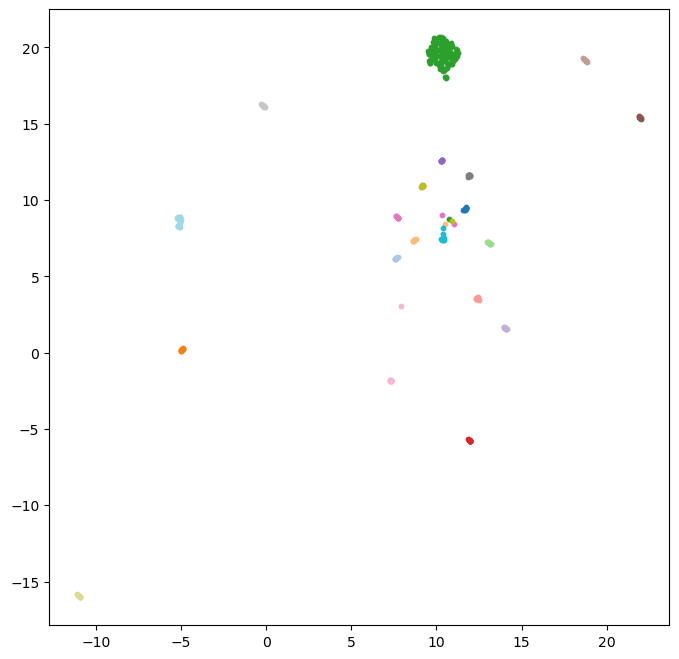

In [9]:
logging.info("Plotting umap on test with pert model")

# Testing new (pertubed) model 
plot_umap(analytics_test_pert, to_annot=False, figsize=(8,8))

## SHAP

In [10]:
logging.info("SHAP")

2023-03-17 17:47:00 INFO SHAP


In [11]:
logging.info("Calc val_train")
val_train = get_res(analytics_train, X_train)

2023-03-17 17:47:00 INFO Calc val_train


2023-03-17 17:47:02 WARNING From /tmp/ipykernel_8111/817268756.py:21: The name tf.keras.backend.get_session is deprecated. Please use tf.compat.v1.keras.backend.get_session instead.



In [12]:
logging.info("Loading test unperturebed")
X_test, y_test, analytics_test = get_all_data(set_type="test", model_path=model_path, subset_counts=subset_counts)

2023-03-17 17:47:05 INFO Loading test unperturebed


#########################################################
########### Splitting by set! (test) #############
#########################################################
Input folder: ../data/processed/220814_neurons
Input subfolder: CD41
Filepath: ../data/processed/220814_neurons/WT/unstressed/CD41/220807_iNDI_WT_unstressed-DAPI_CD41_NONO_TDP43-01_WT.tif_processed
Input subfolder: CLTC
Filepath: ../data/processed/220814_neurons/WT/unstressed/CLTC/220808_iNDI_WT_unstressed-DAPI_Phalloidin_PSD95_CLTC-01_WT.tif_processed
Input subfolder: DAPI
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/220805_iNDI_WT_unstressed-DAPI_G3BP1_TIA1_KIF5A-01_WT.tif_processed
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/220807_iNDI_WT_unstressed-DAPI_CD41_NONO_TDP43-01_WT.tif_processed
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/220808_iNDI_WT_unstressed-DAPI_PURA_SQSTM1_FMRP-01_WT.tif_processed
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/22080

In [13]:
y_un, indx_subset = np.unique(y_test.reshape(-1), return_index=True)

In [14]:
logging.info("Calc val_test")
val_test = get_res(analytics_test, X_test)[indx_subset]
img_test = X_test[indx_subset,...]

2023-03-17 17:47:37 INFO Calc val_test


In [15]:
logging.info("Unperturbed")

2023-03-17 17:47:43 INFO Unperturbed


In [16]:
classifier_model_test = get_classifier_mode(analytics_test, layer=1)

2023-03-17 17:47:43 INFO plot shap multiple plots


2023-03-17 17:47:43 WARNING From /home/labs/eransegal/sagyk/.conda/envs/cytoself/lib/python3.7/site-packages/shap/explainers/deep/deep_tf.py:119: The name tf.keras.backend.get_session is deprecated. Please use tf.compat.v1.keras.backend.get_session instead.



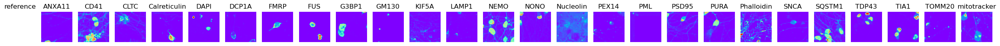

ANXA11
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


2023-03-17 17:47:45 WARNING From /home/labs/eransegal/sagyk/.conda/envs/cytoself/lib/python3.7/site-packages/shap/explainers/deep/deep_tf.py:490: where (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


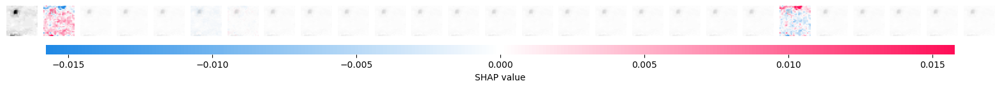

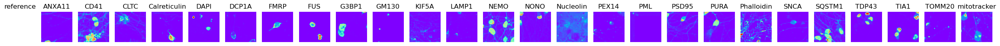

CD41


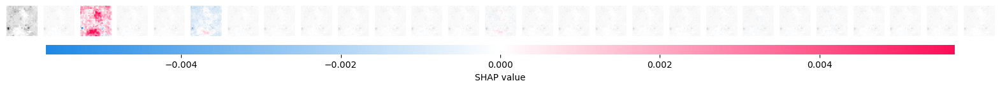

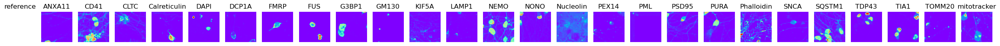

CLTC


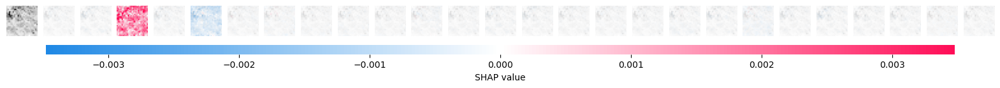

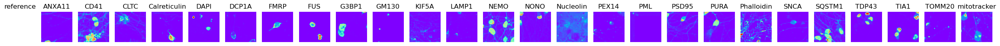

Calreticulin


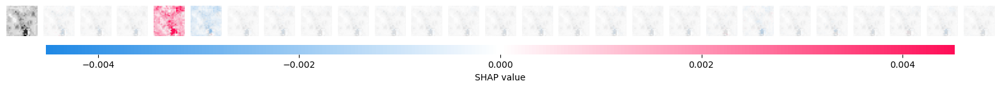

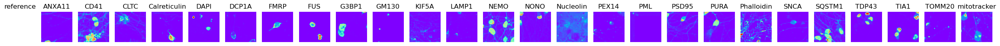

DAPI


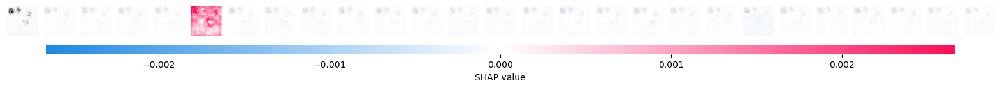

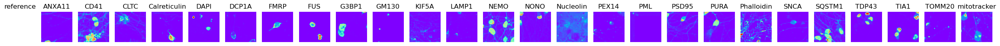

DCP1A


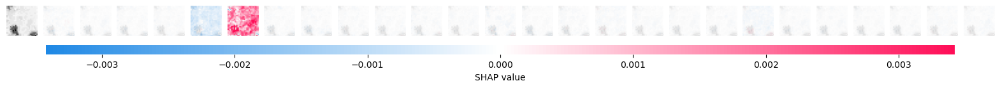

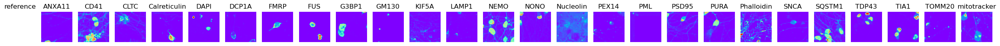

FMRP


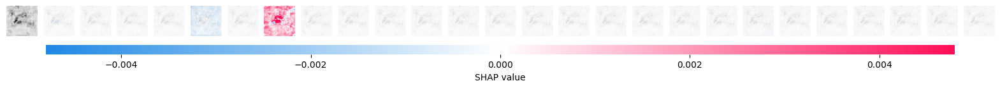

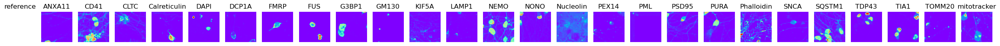

FUS


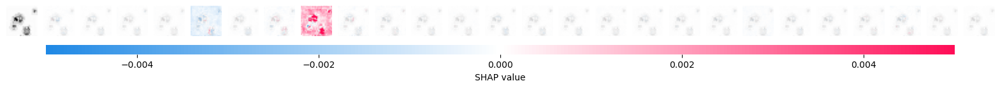

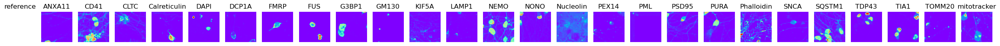

G3BP1


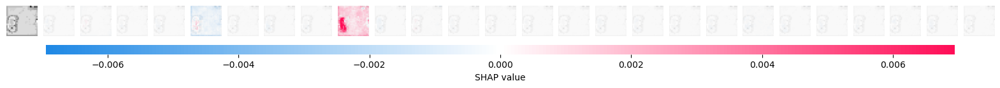

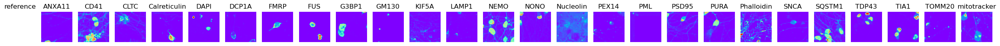

GM130


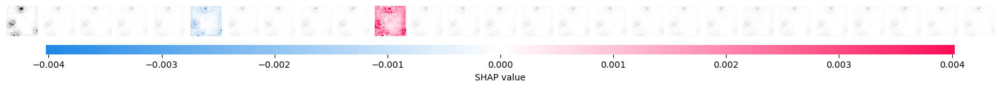

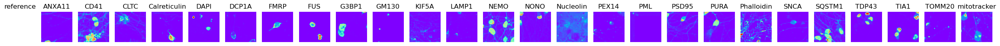

KIF5A


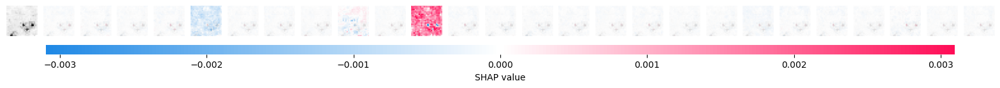

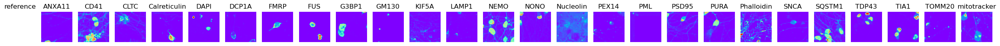

LAMP1


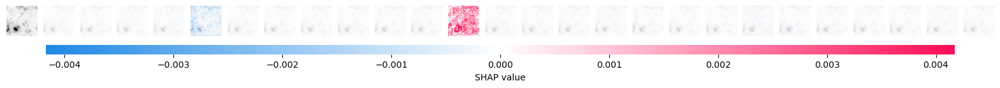

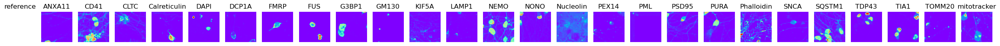

NEMO


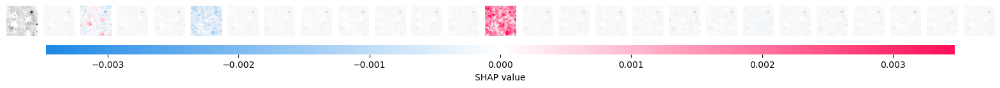

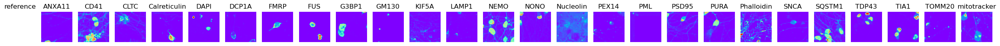

NONO


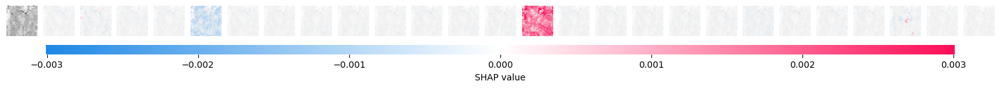

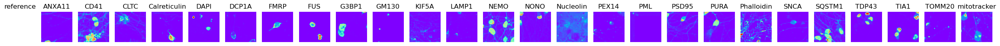

Nucleolin


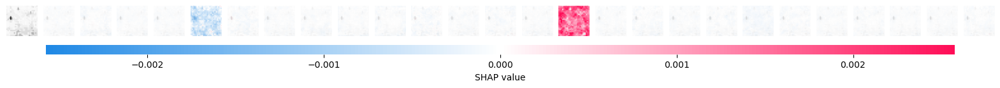

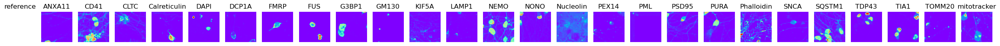

PEX14


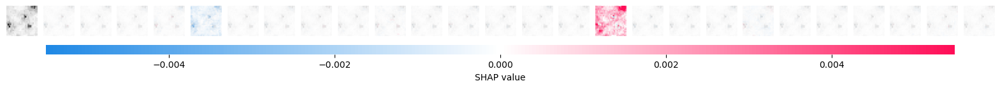

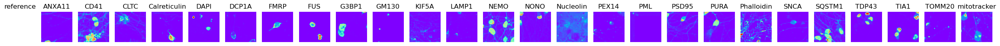

PML


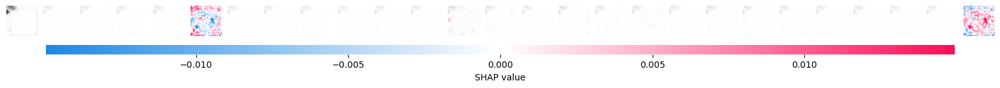

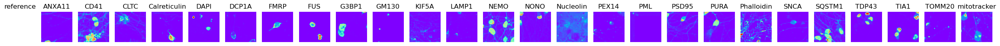

PSD95


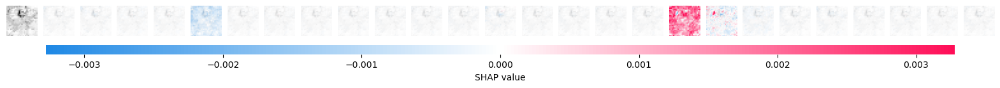

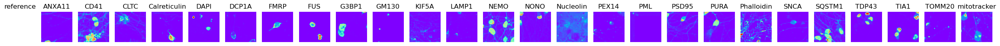

PURA


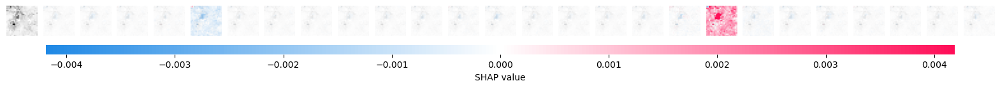

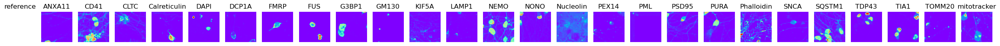

Phalloidin


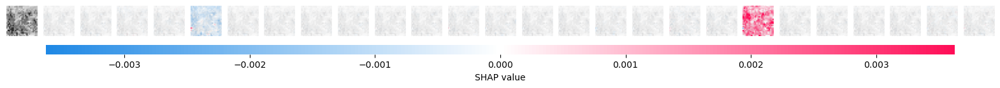

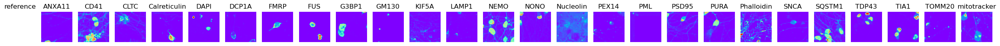

SNCA


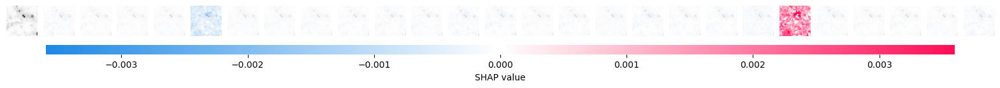

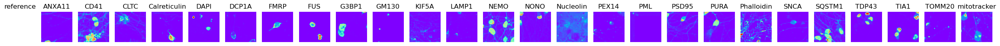

SQSTM1


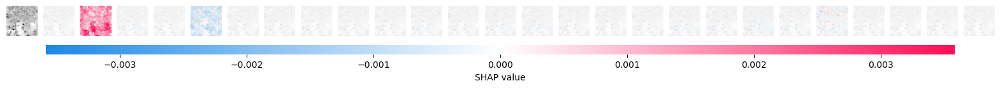

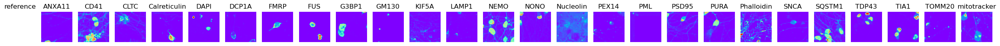

TDP43


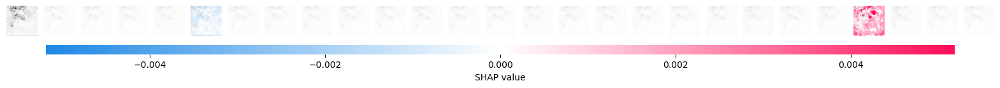

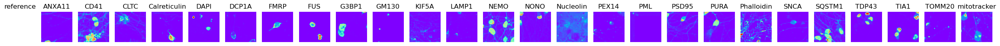

TIA1


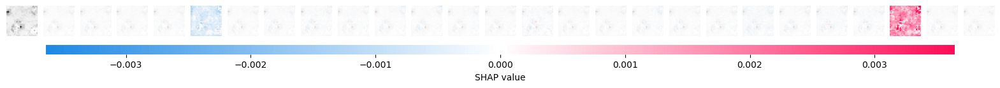

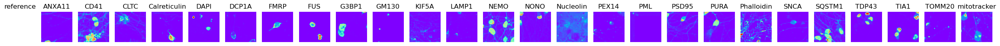

TOMM20


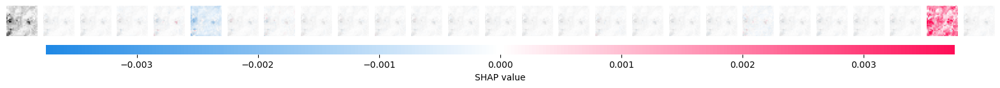

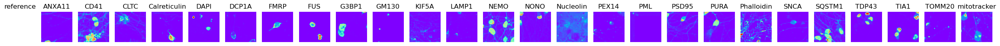

mitotracker


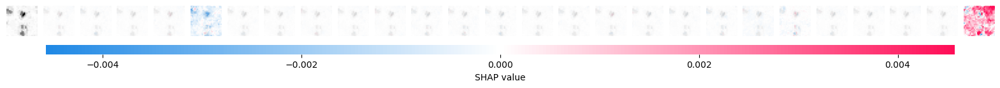

In [17]:
logging.info("plot shap multiple plots")
plot_SHAP(img_test,y_test[indx_subset], val_train, val_test, classifier_model_test, single_grid=False)

2023-03-17 17:51:10 INFO plot shap single plot


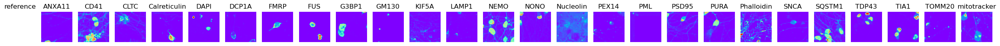

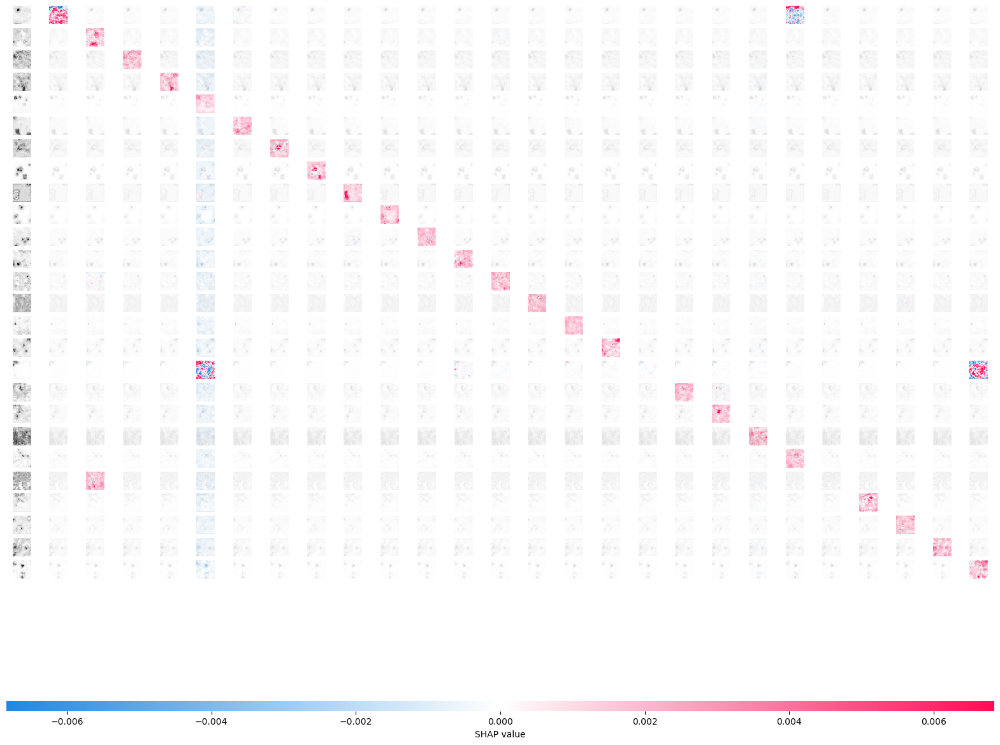

In [18]:
logging.info("plot shap single plot")
plot_SHAP(img_test,y_test[indx_subset], val_train, val_test, classifier_model_test, single_grid=True)

In [19]:
logging.info("perturbed")

2023-03-17 17:54:29 INFO perturbed


In [20]:
logging.info("Loading test perturebed")
X_train_pert, y_train_pert, analytics_train_pert = get_all_data(set_type="train", model_path=model_path_perturbed, subset_counts=subset_counts)


2023-03-17 17:54:29 INFO Loading test perturebed


#########################################################
########### Splitting by set! (train) #############
#########################################################
Input folder: ../data/processed/220814_neurons
Input subfolder: CD41
Filepath: ../data/processed/220814_neurons/WT/unstressed/CD41/220807_iNDI_WT_unstressed-DAPI_CD41_NONO_TDP43-01_WT.tif_processed
Input subfolder: CLTC
Filepath: ../data/processed/220814_neurons/WT/unstressed/CLTC/220808_iNDI_WT_unstressed-DAPI_Phalloidin_PSD95_CLTC-01_WT.tif_processed
Input subfolder: DAPI
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/220805_iNDI_WT_unstressed-DAPI_G3BP1_TIA1_KIF5A-01_WT.tif_processed
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/220807_iNDI_WT_unstressed-DAPI_CD41_NONO_TDP43-01_WT.tif_processed
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/220808_iNDI_WT_unstressed-DAPI_PURA_SQSTM1_FMRP-01_WT.tif_processed
Filepath: ../data/processed/220814_neurons/WT/unstressed/DAPI/2208

In [21]:
logging.info("Calc val_train pert")
val_train_pert = get_res(analytics_train_pert, X_train_pert)

2023-03-17 17:55:02 INFO Calc val_train pert


In [22]:
_, indx_subset_pert = np.unique(y_test_pert.reshape(-1), return_index=True)

In [23]:
logging.info("Calc val_test pert")
val_test_pert = get_res(analytics_test_pert, X_test_pert)[indx_subset_pert]
img_test_pert = X_test_pert[indx_subset_pert,...]

2023-03-17 17:55:10 INFO Calc val_test pert


In [24]:
classifier_model_test_pert = get_classifier_mode(analytics_test_pert, layer=1)

2023-03-17 17:55:19 INFO Plotting SHAP multiple plots


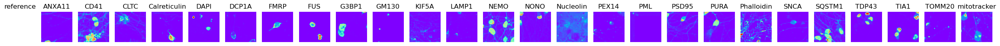

ANXA11


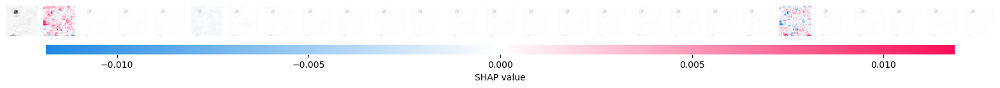

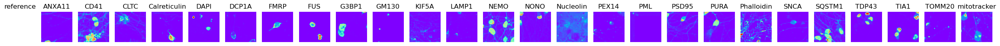

CD41


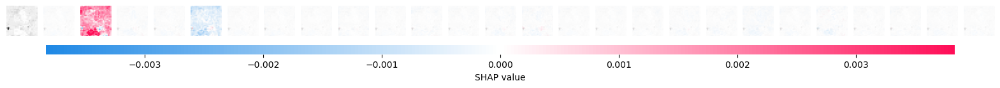

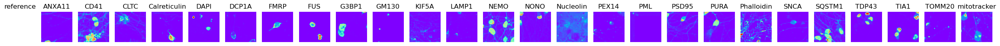

CLTC


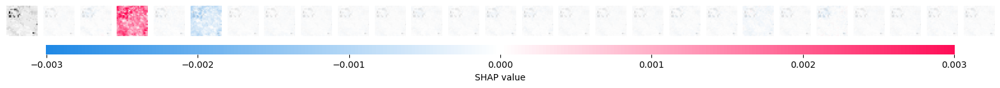

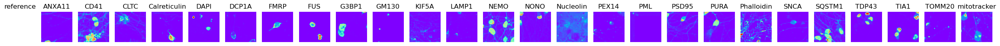

Calreticulin


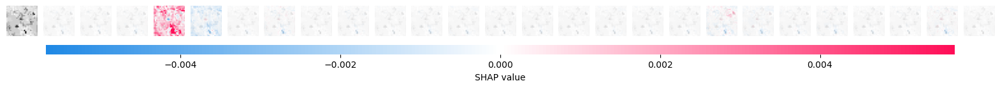

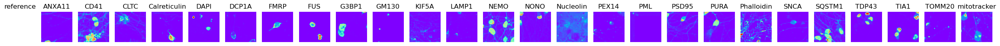

DAPI


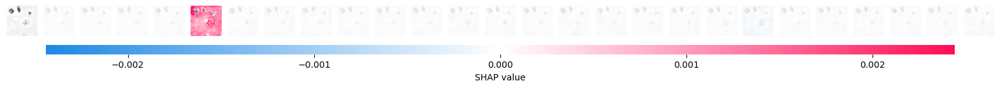

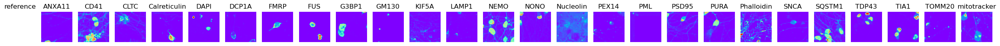

DCP1A


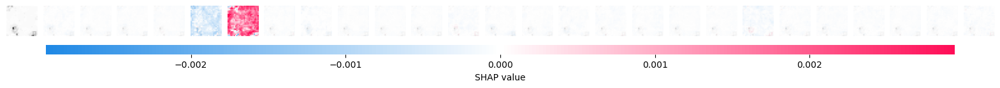

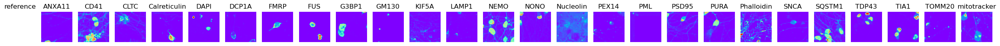

FMRP


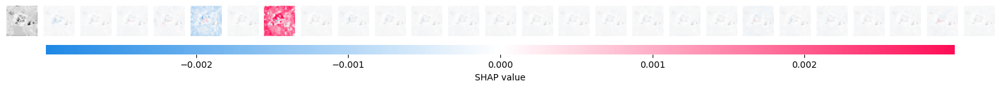

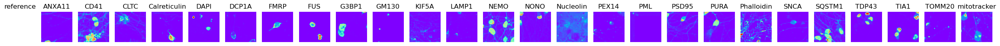

FUS


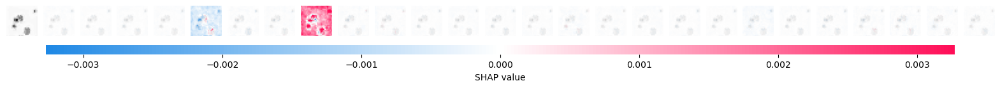

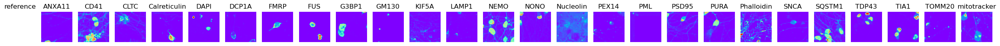

G3BP1


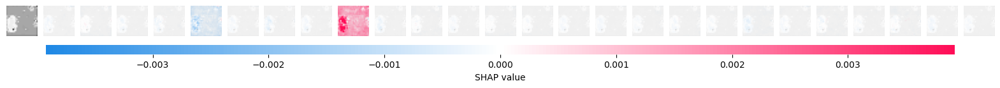

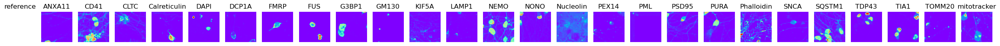

GM130


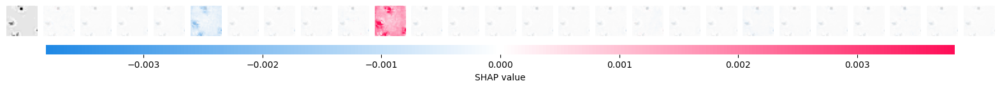

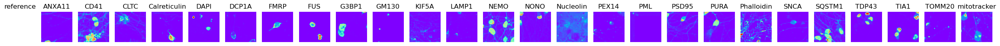

KIF5A


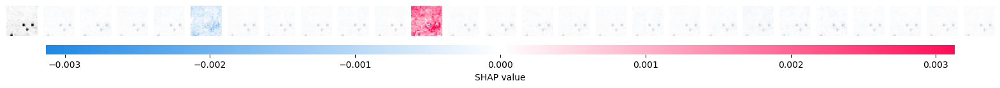

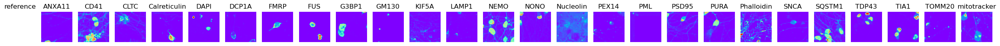

LAMP1


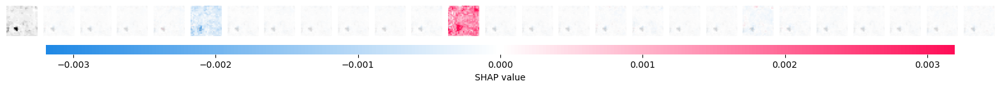

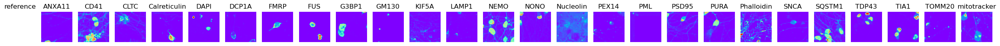

NEMO


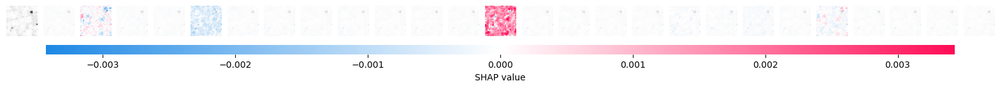

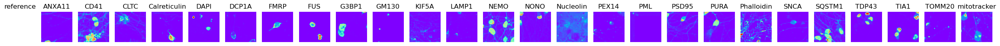

NONO


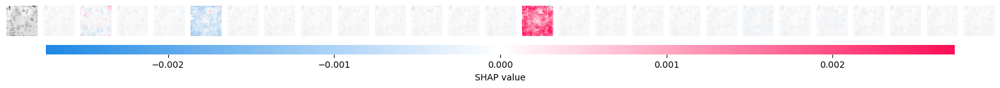

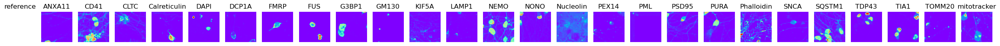

Nucleolin


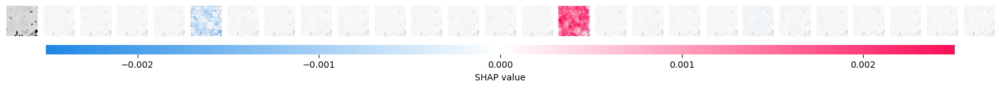

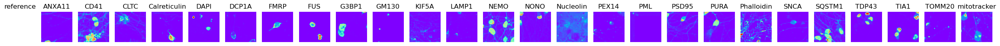

PEX14


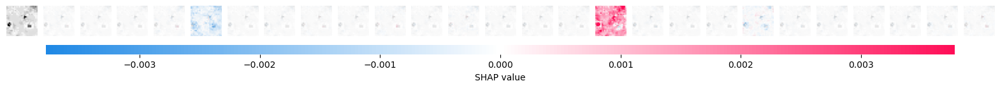

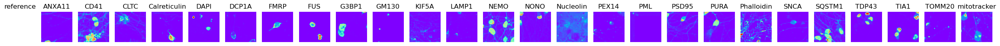

PML


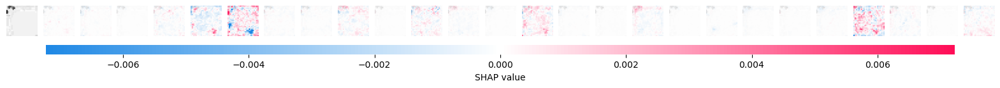

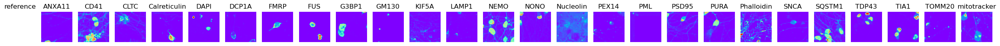

PSD95


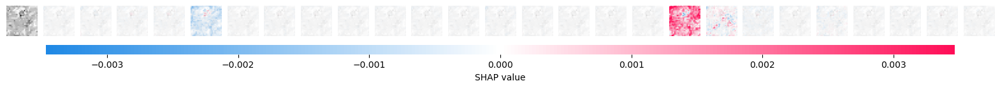

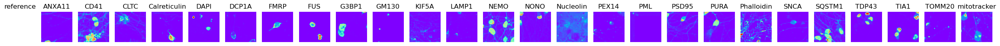

PURA


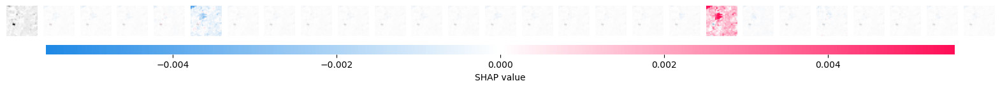

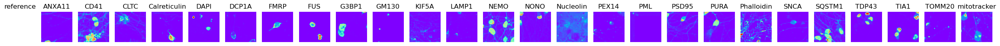

Phalloidin


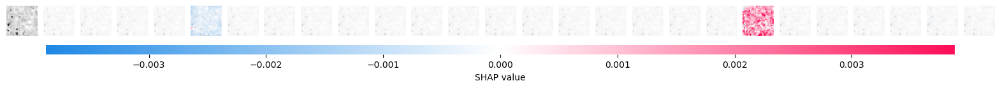

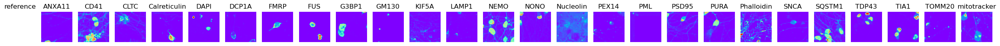

SNCA


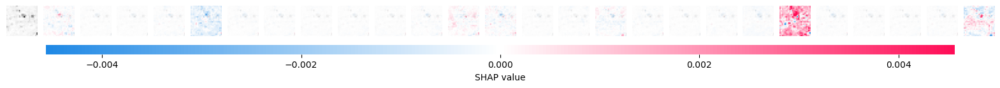

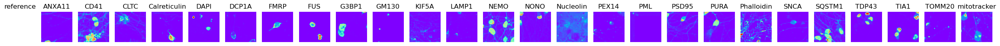

SQSTM1


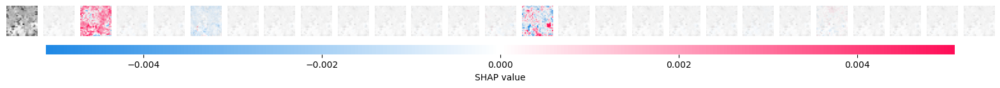

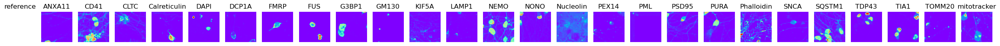

TDP43


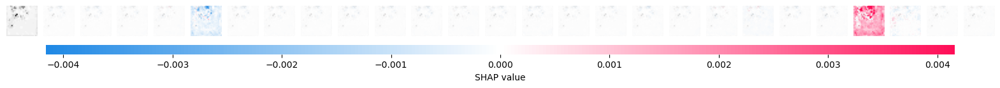

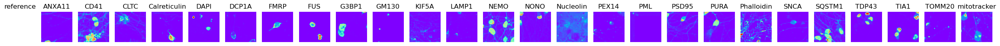

TIA1


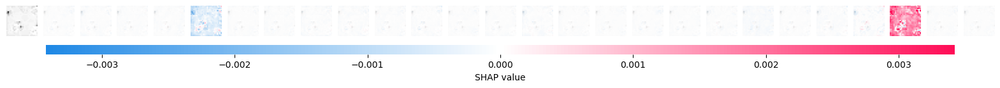

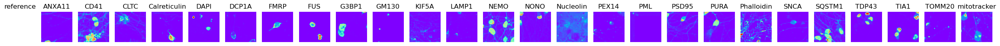

TOMM20


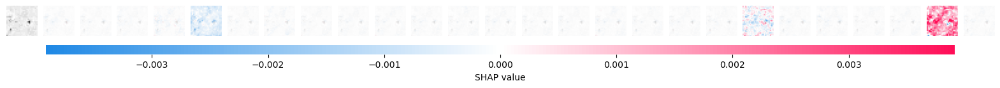

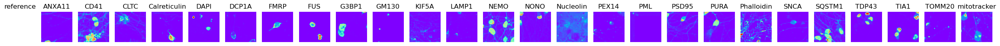

mitotracker


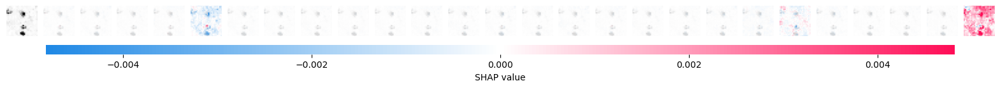

In [25]:
logging.info("Plotting SHAP multiple plots")
plot_SHAP(img_test_pert,y_test_pert[indx_subset], val_train_pert, val_test_pert, classifier_model_test_pert, single_grid=False)

2023-03-17 17:58:54 INFO Plotting SHAP single plot


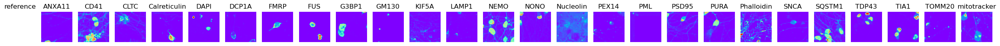

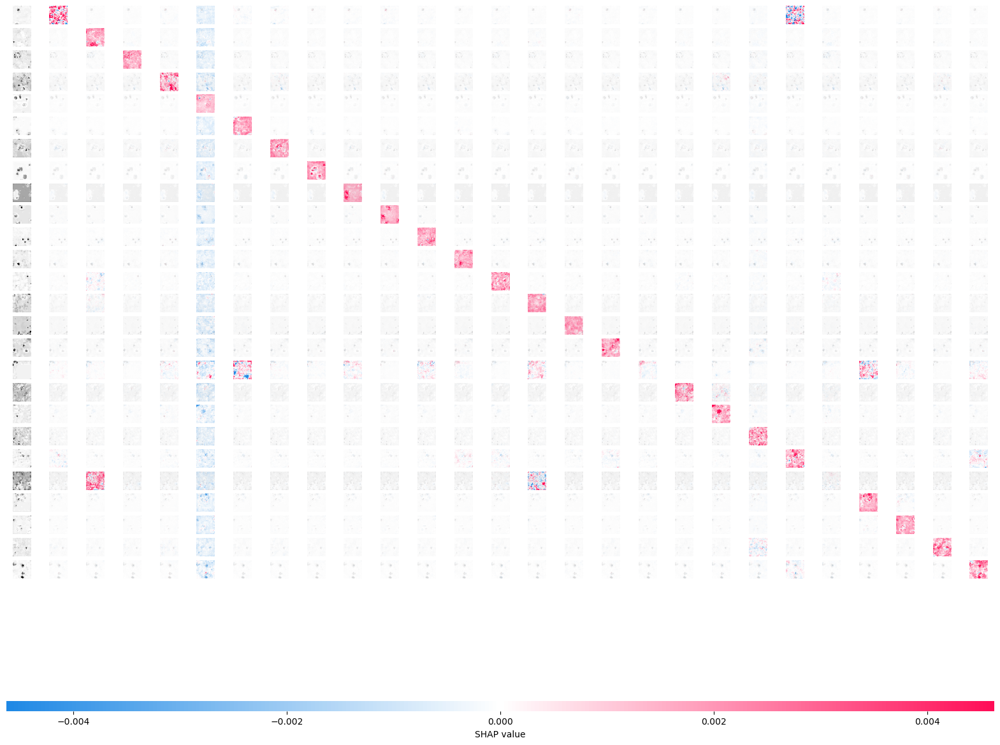

In [26]:
logging.info("Plotting SHAP single plot")
plot_SHAP(img_test_pert,y_test_pert[indx_subset], val_train_pert, val_test_pert, classifier_model_test_pert, single_grid=True)

In [27]:
logging.info("Done!")

2023-03-17 18:02:19 INFO Done!
